<div style="width:100%;">
    <div style="width:100%; border-top:2px solid black; border-bottom:2px solid black; padding:10px;">
        <b><font size="+2">&nbsp;</font></b>
    </div>
    <h1><center><bold><font size="+4">AUTOENCODER-BASED VOICE CONVERSION</font></bold></center></h1>
    <div style="width:100%; border-top:2px solid black; border-bottom:2px solid black; padding:10px;">
        <span style="text-align:left; float:left;">
            <b><font size="+2">EE 475</font></b>
        </span>&nbsp;
        <span style="text-align:right; float:right;">
            <b><font size="+2">Project by Michael Lee</font></b>
        </span>
    </div>
</div>

In [1]:
import IPython
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

<hr style="border:1px solid black;">

# **Quick Overview**
For my course project, I decided to experiment with machine learning applied to voice conversion.  Specifically, I downloaded code that the authors of [1] made publicly available on GitHub.  Admittedly, while I was able to get the code working, my results were somewhat lackluster (quite possibly due in part to a lack of training data).  However, my attempts to improve my results exposed me to new concepts and forced me to learn new things.

<hr style="border:1px solid black;">

# **Introduction**
Voice conversion is the process of taking speech from one speaker (source speaker) and modifying that speech to sound like another speaker (target speaker).  One strategy for performing voice conversion is to utilize what is known as *parallel data*, which consists of two different speakers saying the same words.  However, parallel data can be difficult to obtain and systems relying on parallel data might not necessarily generalize beyond the two speakers featured in the data.

At least up until 2019, voice conversion systems that do not rely on parallel data were less numerous than their parallel data counterparts.  Moreover, most systems were specialized to converting between two speakers, which limits one to one source and one target speaker.  An ample amount of data for training was also typically needed, meaning that one would need a fair amount of data from the source speaker before voice conversion could be performed.

The 2019 paper "AUTOVC: Zero-Shot Voice Style Transfer with Only Autoencoder Loss" [1] introduced AutoVC, which addresses the limitations mentioned in the previous paragraph.  AutoVC views speech as consisting of two types of information: information about the speaker and information about the content of the speech.  The former describes "who uttered the speech" and the latter describes "what was uttered".  It turns out that an autoencoder structure is suited for this view, something which AutoVC takes advantage of. 


<center><br/><font size="-1">&nbsp;&nbsp;&nbsp;&nbsp;<b><u>NOTE:</u></b> This introduction section was paraphrased from the introduction of [1].</font></center>

<hr style="border:1px solid black;">

# **How AutoVC Works (Basic Overview)**
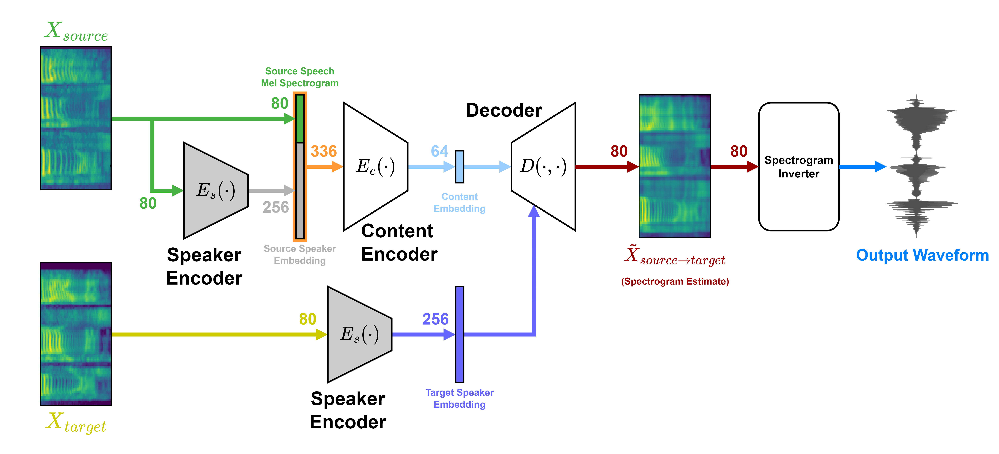
<center><b>Figure 1:</b> AutoVC architecture [1]</center>

The AutoVC system is a voice conversion system that is based off of an encoder-decoder/autoencoder architecture.  The encoder portion takes a speech signal—or more specifically its spectrogram—as its input and outputs a representation of the content of the speech, i.e. a content embedding.  Ideally, this output representation will not contain any information about the speaker, thus isolating the speech content from the speaker.

The content embedding output from the encoder is then fed into the decoder portion.  Information about the desired target speaker, i.e. the target speaker embedding, is also fed to the decoder.  These two pieces of information complement each other: the content embedding describes what was said without describing the speaker, while the target speaker embedding describes the speaker without describing speech content.  The decoder takes this information and produces a spectrogram of a speech signal.  In the ideal case, this signal will contain the utterances of the source speaker spoken as if the target speaker were speaking them (after the spectrogram is inverted).

The final step in the conversion process is feeding the spectrogram output of the decoder into a network that takes spectrograms and outputs raw audio signals.  The spectrogram inverter described in [1] was based off of WaveNet.

<hr style="border:1px solid black;">

# **An Informal Ablation Study**

The content encoder in the AutoVC architecture takes an 80-sample mel spectrogram of the source speaker's speech concatenated with a 256-dimensional time-varing (source) speaker embedding.  This embedding is generated by a speaker encoder (leftmost speaker encoder in Figure 1) that takes the source speaker's mel spectrograms as its input.

However, my own observations seem to indicate that the concatenated speaker embedding appears to have very little perceivable effect on how the final synthesized/voice converted waveforms sound.  Here are some of my observations:
*   Setting the concatenated speaker embedding vectors to all zeros/random values does not appear to have an effect on the synthesized speech.
*   There was generally very little observable difference between:
  * Using a constant embedding for all input frames to the content encoder.
  * Running a single spectrogram frame through the speaker encoder and concatenating the resulting output.
  * Running multiple spectrogram frames through the speaker encoder and concatenating the resulting output.

Note that these observations were made while using the pre-trained models linked on [1]'s corresponding GitHub page.

Audio clips illustrating some of the aforementioned points are included below:

In [2]:
# Male (p227) source speech waveform.  Source speaker embedding is fixed and
# corresponds to the speaker (p227).  Target speaker is female (p228).
IPython.display.Audio(r'Results/Ablation/p227_speech_with_p227_emb_to_p228.wav')

# Male (p227) source speech waveform.  Source speaker embedding is fixed and
# corresponds to a female speaker (p228).  Target speaker is female (p228).
IPython.display.Audio(r'Results/Ablation/p227_speech_with_p228_emb_to_p228.wav')

# Male (p227) source speech waveform.  Source speaker embedding for each frame
# is generated by the speaker encoder from the spectrogram at that frame.
IPython.display.Audio(r'Results/Ablation/p227_speech_time_var_1_frame_to_p228.wav')

# Same as previous, except 20 (previous/one current) frames are fed to the
# speaker encoder.  The last output is what is used for the speaker embedding.
IPython.display.Audio(r'Results/Ablation/p227_speech_time_var_20_frame_to_p228.wav')

# Same as previous, except with 40 frames.
IPython.display.Audio(r'Results/Ablation/p227_speech_time_var_40_frame_to_p228.wav')

# Same as previous, except with 200 frames.
IPython.display.Audio(r'Results/Ablation/p227_speech_time_var_200_frame_to_p228.wav')

While my investigation was not rigorous, it seems possible that including source speaker embeddings at the input of the content encoder might not be all that necessary or impactful.  In that case, one might be able to simplify the model by removing the source speaker embedding/speaker encoder at the content encoder's input.

### **Additional Notes**

Interestingly, the published code for [1] appears to concatenate a fixed source speaker embedding to the content encoder input vector rather than having a speaker encoder generate source speaker embeddings on the fly.  This differs from what is described in Section 4.1 of [1].

<hr style="border:1px solid black;">

# **Difficulties Encountered**

I ran into difficulties when trying to training model and when using my own data.  I believe this was largely due to me not having enough data.  For reference, the dataset used to train the content encoder and decoder (the VCTK corpus) in [1] has 44 hours of speech from 109 different speakers.  In contrast, the data I tried to use was nowhere near as vast and only consisted of two speakers at most.  To summarize some of my difficulties:
* Tried to train the content encoder and decoder model but was unsuccessful
  * Attempted training using a dataset consisting of two speakers with ~5 minutes of speech each.
  * Resulting model outputs did not even sound like speech.
* Was unsuccessful in generating my own speaker embeddings
  * Tried to generate speaker embeddings using the averaging described in Section 5.1 of the AutoVC paper.
  * When using these embeddings as target speaker embeddings, the results sounded like speech but were generally unintelligible.
  * Somewhat rare snippets of semi-intelligibility at times, but I had the advantage of knowing what the source speech said.
  * Changes in pitch and timbre consistent with the represented speaker were observed, however.

However, the pre-trained models provided in [1]'s GitHub repository seemed to work fairly well.  I observed the best voice results when using one of the speaker embeddings (for speaker p228) which was provided in the repository.

<hr style="border:1px solid black;">

# **Voice Conversion Results**

Here are some results of a few voice conversions.  Original source audio is also included for comparison.  The text is from the Bee Movie.

### Female (TTS) to Male Speaker (p227)
#### Original source audio

In [3]:
IPython.display.Audio(r'Results/BeeMovie/female.wav')

#### Converted

In [4]:
IPython.display.Audio(r'Results/BeeMovie/female_to_p227.wav')

### Male (TTS) to Female Speaker (p228)
#### Original source audio

In [5]:
IPython.display.Audio(r'Results/BeeMovie/male.wav')

#### Converted

In [6]:
IPython.display.Audio(r'Results/BeeMovie/male_to_p228.wav')

### Male (Myself) to Female Speaker (p228)
#### Original source audio

In [7]:
IPython.display.Audio(r'Results/BeeMovie/myself.wav')

#### Converted

In [8]:
IPython.display.Audio(r'Results/BeeMovie/myself_to_p228.wav')

<hr style="border:1px solid black;">

# **References**

1. K. Qian, Y. Zhang, S. Chang, X. Yang, and M. Hasegawa-Johnson, “AUTOVC: Zero-shot voice style transfer with only Autoencoder Loss,” arXiv.org, 06-Jun-2019. [Online]. Available: https://doi.org/10.48550/arxiv.1905.05879. [Accessed: 01-Dec-2022]. 